# Latar Belakang

Database ini menjelaskan hasil survei dari sebuah bandara udara mengenai penilaian kepuasan pelayanan penerbangan dari setiap penumpang. 

Survei yang diberikan dibagi dalam beberapa kategori untuk mengetahui secara umum nilai kepuasan penumpang dan apa yang bisa ditingkatkan dari data-data yang didapatkan.

## Peryataan Masalah

Bandara ingin mengetahui bagaimana kualitas layanan penerbangan saat ini melalui sistem rating yang diberikan dalam bentuk survei 

dengan penilaian dari 1-5 di mana 1 adalah nilai terendah dan 5 adalah nilai tertinggi.

Data yang didapat akan membantu bandara meningkatkan mutu pelayanan dari kategori yang diberikan.

Pertanyaan yang ingin dijawab adalah:

Hubungan nilai-nilai survei dengan kepuasaan penumpang.


# Data

## Import necessary lib

In [370]:
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px 

from scipy.stats import normaltest, chi2_contingency, mannwhitneyu, ttest_ind

Dataset ini berisi informasi terkait dengan penilain pelayanan pesawat terbang oleh penumpang.
Terdapat 25 kolom di dalam dataset airline passanger satisfaction.csv yaitu:
- Unnamed: 0                        : Kolom bermasalah dalam dataset yang harus diperbaiki
- id                                : No id unik untuk setiap penumpang 
- Gender                            : Jenis kelamin penumpang
- Customer Type                     : Kesetiaan penumpang terhadap brand pesawat terbang yang dinaiki
- Age                               : Umur penumpang
- Type of Travel                    : Tujuan penerbangan (bisnis atau hiburan)
- Class                             : Kelas penerbangan
- Flight Distance                   : Jarak tempuh penerbangan
- Inflight wifi service             : Layanan internet selama penerbangan
- Departure/Arrival time convenient : Ketepatan waktu keberangkatan/ketibaan
- Ease of Online booking            : Kemudahan pemesanan tiket secara online
- Gate location                     : Lokasi gerbang
- Food and drink                    : Penilaian makanan dan minuman
- Online boarding                   : Penilaian boarding online
- Seat comfort                      : Kenyamanan tempat duduk
- Inflight entertainment            : Hiburan dalam penerbangan
- On-board service                  : Layanan dalam penerbangan
- Leg room service                  : Ruang kaki dalam pesawat
- Baggage handling                  : Penanganan bagasi
- Checkin service                   : Layanan check-in
- Inflight service                  : Layanan dalam penerbangan
- Cleanliness                       : Kebersihan pesawat
- Departure Delay in Minutes        : Keterlambatan Keberangkatan dalam Beberapa Menit
- Arrival Delay in Minutes          : Keterlambatan Kedatangan dalam Beberapa Menit
- Satisfaction                      : Nilai kepuasan penumpang

In [371]:
pd.set_option('display.max_columns', None)

**pd.set_option('display.max_columns', None)** digunakan untuk melihat semua kolom yang terdapat dalam dataset

## Informasi Data

In [372]:
df = pd.read_csv('airline passanger satisfaction.csv')
display(df.head(),df.tail())

,Unnamed: 0,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.0,satisfied
3,3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,4,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0.0,satisfied


,Unnamed: 0,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
103899,103899,94171,Female,disloyal Customer,23,Business travel,Eco,192,2,1,2,3,2,2,2,2,3,1,4,2,3,2,3,0.0,neutral or dissatisfied
103900,103900,73097,Male,Loyal Customer,49,Business travel,Business,2347,4,4,4,4,2,4,5,5,5,5,5,5,5,4,0,0.0,satisfied
103901,103901,68825,Male,disloyal Customer,30,Business travel,Business,1995,1,1,1,3,4,1,5,4,3,2,4,5,5,4,7,14.0,neutral or dissatisfied
103902,103902,54173,Female,disloyal Customer,22,Business travel,Eco,1000,1,1,1,5,1,1,1,1,4,5,1,5,4,1,0,0.0,neutral or dissatisfied
103903,103903,62567,Male,Loyal Customer,27,Business travel,Business,1723,1,3,3,3,1,1,1,1,1,1,4,4,3,1,0,0.0,neutral or dissatisfied


In [373]:
print(f'Jumlah baris dan kolom di dataset df adalah {df.shape}')
df.info()

Jumlah baris dan kolom di dataset df adalah (103904, 25)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 25 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Unnamed: 0                         103904 non-null  int64  
 1   id                                 103904 non-null  int64  
 2   Gender                             103904 non-null  object 
 3   Customer Type                      103904 non-null  object 
 4   Age                                103904 non-null  int64  
 5   Type of Travel                     103904 non-null  object 
 6   Class                              103904 non-null  object 
 7   Flight Distance                    103904 non-null  int64  
 8   Inflight wifi service              103904 non-null  int64  
 9   Departure/Arrival time convenient  103904 non-null  int64  
 10  Ease of Online booking             103904 non-n

Ditemukan terdapat 310 *missing value* pada **Arrival Delay in Minutes**.

In [374]:
display(df.describe(), df.describe(include='object'))

,Unnamed: 0,id,Age,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes
count,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103594.000000
mean,51951.500000,64924.210502,39.379706,1189.448375,2.729683,3.060296,2.756901,2.976883,3.202129,3.250375,3.439396,3.358158,3.382363,3.351055,3.631833,3.304290,3.640428,3.286351,14.815618,15.178678
std,29994.645522,37463.812252,15.114964,997.147281,1.327829,1.525075,1.398929,1.277621,1.329533,1.349509,1.319088,1.332991,1.288354,1.315605,1.180903,1.265396,1.175663,1.312273,38.230901,38.698682
min,0.000000,1.000000,7.000000,31.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,25975.750000,32533.750000,27.000000,414.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,3.000000,3.000000,2.000000,0.000000,0.000000
50%,51951.500000,64856.500000,40.000000,843.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,3.000000,0.000000,0.000000
75%,77927.250000,97368.250000,51.000000,1743.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,5.000000,4.000000,5.000000,4.000000,12.000000,13.000000
max,103903.000000,129880.000000,85.000000,4983.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1592.000000,1584.000000


,Gender,Customer Type,Type of Travel,Class,satisfaction
count,103904,103904,103904,103904,103904
unique,2,2,2,3,2
top,Female,Loyal Customer,Business travel,Business,neutral or dissatisfied
freq,52727,84923,71655,49665,58879


In [375]:
df[df.duplicated()]

,Unnamed: 0,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction


Tidak ada data duplikasi

In [376]:
pd.set_option('display.max_colwidth', -1)
# data unik di tiap kolom
list = []
for col in df.columns :
    list.append( [col, df[col].nunique(), df[col].unique()])

tabel = pd.DataFrame(columns=['Nama kolom', 'Jumlah data unik', 'Sampel unik'],
                     data=list)
tabel

C:\Users\ROG\AppData\Local\Temp\ipykernel_12424\4099324713.py:1: FutureWarning:

Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.



,Nama kolom,Jumlah data unik,Sampel unik
0,Unnamed: 0,103904,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, ...]"
1,id,103904,"[70172, 5047, 110028, 24026, 119299, 111157, 82113, 96462, 79485, 65725, 34991, 51412, 98628, 83502, 95789, 100580, 71142, 127461, 70354, 66246, 39076, 22434, 43510, 114090, 105420, 102956, 18510, 14925, 118319, 75460, 48492, 27809, 70594, 30089, 58779, 79659, 110293, 48014, 96517, 64685, 64138, 60373, 14849, 28319, 103012, 124114, 107794, 81983, 53164, 82042, 72127, 113046, 1050, 54886, 125918, 7467, 78972, 126625, 114501, 114813, 32167, 68001, 117052, 8661, 57165, 78610, 51058, 92027, 115534, 9261, 61033, 75930, 112142, 24518, 112524, 101639, 85018, 106922, 32564, 92242, 73302, 42267, 121358, 65655, 88062, 91330, 22031, 27921, 51947, 40017, 76392, 118486, 6012, 30183, 41652, 15138, 123589, 114534, 93076, 96963, ...]"
2,Gender,2,"[Male, Female]"
3,Customer Type,2,"[Loyal Customer, disloyal Customer]"
4,Age,75,"[13, 25, 26, 61, 47, 52, 41, 20, 24, 12, 53, 33, 45, 38, 9, 17, 43, 58, 23, 57, 49, 36, 22, 31, 15, 35, 67, 37, 40, 34, 39, 50, 29, 54, 21, 28, 27, 69, 60, 48, 59, 46, 30, 66, 64, 44, 51, 32, 19, 42, 16, 11, 62, 8, 56, 68, 55, 18, 65, 72, 70, 63, 10, 7, 14, 80, 74, 71, 85, 73, 76, 77, 75, 79, 78]"
5,Type of Travel,2,"[Personal Travel, Business travel]"
6,Class,3,"[Eco Plus, Business, Eco]"
7,Flight Distance,3802,"[460, 235, 1142, 562, 214, 1180, 1276, 2035, 853, 1061, 1182, 308, 834, 946, 453, 486, 2123, 2075, 2486, 1174, 208, 752, 2139, 452, 719, 1561, 315, 3347, 2342, 819, 1043, 2611, 1192, 349, 883, 550, 302, 354, 1734, 1452, 296, 2882, 529, 1522, 612, 1454, 731, 2076, 309, 775, 861, 3334, 2496, 602, 446, 216, 3475, 646, 2501, 2227, 1426, 190, 1532, 157, 1506, 205, 895, 516, 909, 1435, 1190, 1259, 1670, 3960, 817, 406, 404, 500, 689, 3100, 525, 931, 304, 1896, 261, 347, 1042, 1773, 342, 297, 332, 2388, 748, 1080, 231, 551, 972, 265, 488, 1144, ...]"
8,Inflight wifi service,6,"[3, 2, 4, 1, 5, 0]"
9,Departure/Arrival time convenient,6,"[4, 2, 5, 3, 1, 0]"


## Data Cleaning

### Setting index

Pada dataset, bisa dilihat terdapat kolom **Unnamed: 0**, yang berisikan nomor sama dengan nomor index. 

Nomor index dan nomor id pada dataset tidak sesuai dengan urutan maka kolom harus diperbaiki untuk kemudahan penglihatan data.

In [377]:
df = df.sort_values('id')
df.head()

,Unnamed: 0,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
90131,90131,1,Male,disloyal Customer,48,Business travel,Business,821,3,3,3,3,5,3,5,5,3,2,5,4,5,5,2,5.0,neutral or dissatisfied
47865,47865,2,Female,Loyal Customer,35,Business travel,Business,821,2,2,2,2,3,5,4,5,5,5,5,3,5,5,26,39.0,satisfied
44425,44425,3,Male,Loyal Customer,41,Business travel,Business,853,4,4,4,4,5,5,5,3,3,3,3,4,3,5,0,0.0,satisfied
96450,96450,4,Male,Loyal Customer,50,Business travel,Business,1905,2,2,2,2,4,4,5,5,5,5,5,3,5,4,0,0.0,satisfied
72524,72524,5,Female,Loyal Customer,49,Business travel,Business,3470,3,3,3,3,4,5,4,3,3,4,3,3,3,5,0,1.0,satisfied


Dimulai dari pengurutan data berdasarkan id penumpang

In [378]:
df = df.reset_index()
df.head()

,index,Unnamed: 0,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,90131,90131,1,Male,disloyal Customer,48,Business travel,Business,821,3,3,3,3,5,3,5,5,3,2,5,4,5,5,2,5.0,neutral or dissatisfied
1,47865,47865,2,Female,Loyal Customer,35,Business travel,Business,821,2,2,2,2,3,5,4,5,5,5,5,3,5,5,26,39.0,satisfied
2,44425,44425,3,Male,Loyal Customer,41,Business travel,Business,853,4,4,4,4,5,5,5,3,3,3,3,4,3,5,0,0.0,satisfied
3,96450,96450,4,Male,Loyal Customer,50,Business travel,Business,1905,2,2,2,2,4,4,5,5,5,5,5,3,5,4,0,0.0,satisfied
4,72524,72524,5,Female,Loyal Customer,49,Business travel,Business,3470,3,3,3,3,4,5,4,3,3,4,3,3,3,5,0,1.0,satisfied


Index direset dengan **reset_index()** agar index dimulai dari 0

In [379]:
df = df.drop(columns=['index','Unnamed: 0'])
df.head()

,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,1,Male,disloyal Customer,48,Business travel,Business,821,3,3,3,3,5,3,5,5,3,2,5,4,5,5,2,5.0,neutral or dissatisfied
1,2,Female,Loyal Customer,35,Business travel,Business,821,2,2,2,2,3,5,4,5,5,5,5,3,5,5,26,39.0,satisfied
2,3,Male,Loyal Customer,41,Business travel,Business,853,4,4,4,4,5,5,5,3,3,3,3,4,3,5,0,0.0,satisfied
3,4,Male,Loyal Customer,50,Business travel,Business,1905,2,2,2,2,4,4,5,5,5,5,5,3,5,4,0,0.0,satisfied
4,5,Female,Loyal Customer,49,Business travel,Business,3470,3,3,3,3,4,5,4,3,3,4,3,3,3,5,0,1.0,satisfied


Kolom **index** dan **Unnamed: 0** dihapus dari dataset

### Finding missing value

In [380]:
df.isna().sum()

id                                   0  
Gender                               0  
Customer Type                        0  
Age                                  0  
Type of Travel                       0  
Class                                0  
Flight Distance                      0  
Inflight wifi service                0  
Departure/Arrival time convenient    0  
Ease of Online booking               0  
Gate location                        0  
Food and drink                       0  
Online boarding                      0  
Seat comfort                         0  
Inflight entertainment               0  
On-board service                     0  
Leg room service                     0  
Baggage handling                     0  
Checkin service                      0  
Inflight service                     0  
Cleanliness                          0  
Departure Delay in Minutes           0  
Arrival Delay in Minutes             310
satisfaction                         0  
dtype: int64

Terdapat 310 nilai yang hilang pada kolom **Arrival Delay in Minutes**

In [381]:
df[pd.isnull(df["Arrival Delay in Minutes"])]

,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
205,247,Male,Loyal Customer,11,Business travel,Business,719,4,1,1,1,4,4,4,4,4,3,4,4,3,4,38,NaN,neutral or dissatisfied
704,884,Male,Loyal Customer,39,Business travel,Business,396,3,3,5,3,3,4,4,3,3,3,3,5,3,3,0,NaN,satisfied
1569,1966,Male,Loyal Customer,36,Business travel,Eco,383,2,4,4,4,2,2,2,2,5,2,3,4,2,2,2,NaN,satisfied
1913,2408,Female,Loyal Customer,55,Business travel,Business,2904,4,5,5,5,5,3,3,4,4,4,4,3,4,4,58,NaN,neutral or dissatisfied
2078,2615,Male,Loyal Customer,46,Personal Travel,Eco,181,2,4,2,3,5,2,5,5,4,4,4,4,3,5,0,NaN,neutral or dissatisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103081,128851,Male,Loyal Customer,14,Personal Travel,Eco,2475,3,2,2,4,1,2,1,1,4,4,4,3,3,1,29,NaN,neutral or dissatisfied
103193,129001,Male,disloyal Customer,46,Business travel,Business,2704,3,3,3,4,4,3,4,4,4,2,3,5,4,4,7,NaN,neutral or dissatisfied
103195,129004,Female,disloyal Customer,17,Business travel,Eco,2704,3,3,3,3,1,3,1,1,2,4,4,1,3,1,0,NaN,neutral or dissatisfied
103203,129015,Male,Loyal Customer,57,Business travel,Business,2704,4,4,4,4,2,4,4,4,4,4,4,3,4,5,0,NaN,satisfied


Menampilkan baris dengan *missing value*

In [382]:
(np.where(pd.isnull(df)))

(array([   205,    704,   1569,   1913,   2078,   2184,   2265,   2719,
          2869,   2870,   3038,   3861,   4053,   4182,   4266,   4707,
          5165,   5276,   5569,   5621,   6105,   6339,   6558,   6740,
          6752,   6753,   6932,   7097,   7262,   7352,   8032,   8757,
          9382,   9433,   9619,  10056,  10116,  10181,  10188,  10885,
         10976,  11736,  13052,  13088,  13214,  13382,  13731,  14068,
         14175,  14485,  14510,  14536,  15157,  15600,  15666,  15667,
         15676,  15683,  15685,  16043,  16367,  16516,  16730,  17016,
         17170,  17361,  17404,  17476,  17563,  17866,  17972,  18098,
         18124,  18583,  18949,  19709,  19947,  20760,  20979,  21125,
         21217,  21611,  21619,  21674,  22075,  22211,  22270,  22852,
         22862,  23775,  23832,  23909,  23914,  25375,  25928,  26648,
         27189,  28514,  28588,  29062,  29352,  29402,  29449,  29809,
         30102,  30183,  30190,  30539,  31481,  31752,  31756, 

Menampilkan no index pada data dengan *missing value*

In [383]:
for col in df.columns:
    print(col)

id
Gender
Customer Type
Age
Type of Travel
Class
Flight Distance
Inflight wifi service
Departure/Arrival time convenient
Ease of Online booking
Gate location
Food and drink
Online boarding
Seat comfort
Inflight entertainment
On-board service
Leg room service
Baggage handling
Checkin service
Inflight service
Cleanliness
Departure Delay in Minutes
Arrival Delay in Minutes
satisfaction


### Filling missing value
*Missing value* hanya terdapat pada **Arrival Delay in Minutes** dengan jumlah 310 data, maka lebih baik jika

data diisi dengan sesuatu berdasarkan data lainnya.

In [384]:
df_arrival = df[['Arrival Delay in Minutes']]
df_arrival.value_counts()

Arrival Delay in Minutes
0.0                         58159
1.0                         2211 
2.0                         2064 
3.0                         1952 
4.0                         1907 
                            ...  
395.0                       1    
306.0                       1    
308.0                       1    
391.0                       1    
1584.0                      1    
Length: 455, dtype: int64

<AxesSubplot:xlabel='Arrival Delay in Minutes'>

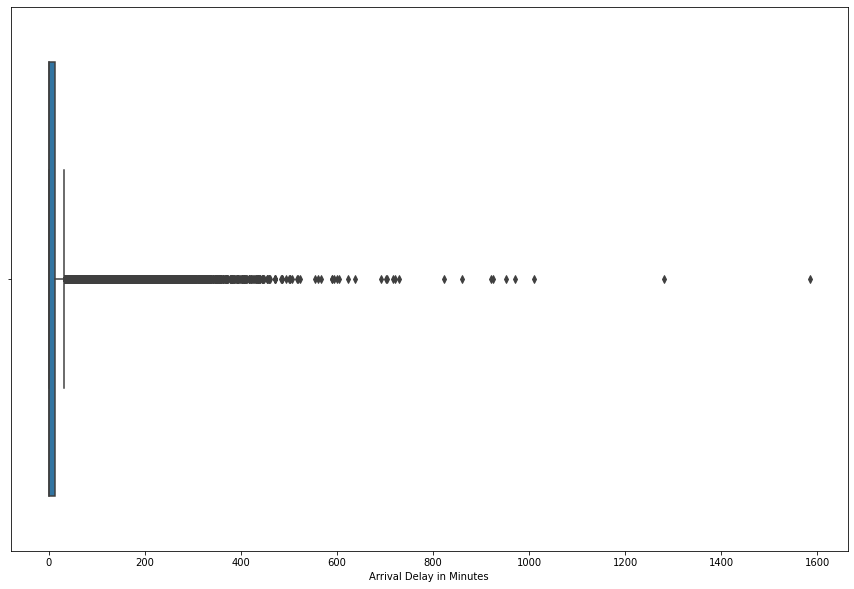

In [385]:
plt.figure(figsize=(15,10))

sns.boxplot(data=df_arrival,x = 'Arrival Delay in Minutes')

Boxplot menunjukan data dalam **Arrival Delay in Minutes** adalah skewed right, maka dari itu median digunakan untuk mengisi *missing value*. 

In [386]:
df.describe().loc[['25%','50%','75%'], ['Arrival Delay in Minutes']].T

,25%,50%,75%
Arrival Delay in Minutes,0.0,0.0,13.0


In [387]:
IQR = 13-0
Q1 = 0
Q3 = 13

Q3 +(1.5*IQR)
Q1 -(1.5*IQR)

-19.5

In [388]:
df['Arrival Delay in Minutes'].median()

0.0

In [389]:
df = df.fillna(df['Arrival Delay in Minutes'].median().round(0))
df.iloc[[205]]

,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
205,247,Male,Loyal Customer,11,Business travel,Business,719,4,1,1,1,4,4,4,4,4,3,4,4,3,4,38,0.0,neutral or dissatisfied


In [390]:
target = []

for i in range(len(df)):
    if df['satisfaction'][i] == 'satisfied':
        target.append(1)

    else:
        target.append(0)

df['Target'] = target
df.head()

,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction,Target
0,1,Male,disloyal Customer,48,Business travel,Business,821,3,3,3,3,5,3,5,5,3,2,5,4,5,5,2,5.0,neutral or dissatisfied,0
1,2,Female,Loyal Customer,35,Business travel,Business,821,2,2,2,2,3,5,4,5,5,5,5,3,5,5,26,39.0,satisfied,1
2,3,Male,Loyal Customer,41,Business travel,Business,853,4,4,4,4,5,5,5,3,3,3,3,4,3,5,0,0.0,satisfied,1
3,4,Male,Loyal Customer,50,Business travel,Business,1905,2,2,2,2,4,4,5,5,5,5,5,3,5,4,0,0.0,satisfied,1
4,5,Female,Loyal Customer,49,Business travel,Business,3470,3,3,3,3,4,5,4,3,3,4,3,3,3,5,0,1.0,satisfied,1


In [391]:
df = df.astype({'Arrival Delay in Minutes':'int'}) 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 25 columns):
 #   Column                             Non-Null Count   Dtype 
---  ------                             --------------   ----- 
 0   id                                 103904 non-null  int64 
 1   Gender                             103904 non-null  object
 2   Customer Type                      103904 non-null  object
 3   Age                                103904 non-null  int64 
 4   Type of Travel                     103904 non-null  object
 5   Class                              103904 non-null  object
 6   Flight Distance                    103904 non-null  int64 
 7   Inflight wifi service              103904 non-null  int64 
 8   Departure/Arrival time convenient  103904 non-null  int64 
 9   Ease of Online booking             103904 non-null  int64 
 10  Gate location                      103904 non-null  int64 
 11  Food and drink                     103904 non-null  

## Grouping by range of age

In [392]:
df.groupby(pd.cut(df["Age"], np.arange(0, 91, 10)))

In [393]:
df_groupby_age = df.groupby(pd.cut(df["Age"], np.arange(0, 91, 10))).count()['id'].to_frame().rename(columns={'id':'Number of people'}).reset_index()
df_groupby_age

,Age,Number of people
0,"(0, 10]",2577
1,"(10, 20]",8756
2,"(20, 30]",21424
3,"(30, 40]",21203
4,"(40, 50]",23199
5,"(50, 60]",18769
6,"(60, 70]",7220
7,"(70, 80]",739
8,"(80, 90]",17


In [394]:
agegroups = []

for i in range(len(df)):
    if df['Age'][i] <= 15:
        agegroups.append('Young')

    elif df['Age'][i] <= 30:
        agegroups.append('Young Adults')

    elif df['Age'][i] <= 45:
        agegroups.append('Adults')

    elif df['Age'][i] <= 55:
        agegroups.append('Old')

    else:
        agegroups.append('Elderly')

df['Age Groups'] = agegroups
df.head()

,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction,Target,Age Groups
0,1,Male,disloyal Customer,48,Business travel,Business,821,3,3,3,3,5,3,5,5,3,2,5,4,5,5,2,5,neutral or dissatisfied,0,Old
1,2,Female,Loyal Customer,35,Business travel,Business,821,2,2,2,2,3,5,4,5,5,5,5,3,5,5,26,39,satisfied,1,Adults
2,3,Male,Loyal Customer,41,Business travel,Business,853,4,4,4,4,5,5,5,3,3,3,3,4,3,5,0,0,satisfied,1,Adults
3,4,Male,Loyal Customer,50,Business travel,Business,1905,2,2,2,2,4,4,5,5,5,5,5,3,5,4,0,0,satisfied,1,Old
4,5,Female,Loyal Customer,49,Business travel,Business,3470,3,3,3,3,4,5,4,3,3,4,3,3,3,5,0,1,satisfied,1,Old


In [395]:
agegroupsrange = []

for i in range(len(df)):
    if df['Age'][i] <= 15:
        agegroupsrange.append('<= 15 tahun')

    elif df['Age'][i] <= 30:
        agegroupsrange.append('15-30 tahun')

    elif df['Age'][i] <= 45:
        agegroupsrange.append('31-45 tahun')

    elif df['Age'][i] <= 55:
        agegroupsrange.append('46-55 tahun')

    else:
        agegroupsrange.append('>55 tahun')

df['Age Groups Range'] = agegroupsrange
df.head()

,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction,Target,Age Groups,Age Groups Range
0,1,Male,disloyal Customer,48,Business travel,Business,821,3,3,3,3,5,3,5,5,3,2,5,4,5,5,2,5,neutral or dissatisfied,0,Old,46-55 tahun
1,2,Female,Loyal Customer,35,Business travel,Business,821,2,2,2,2,3,5,4,5,5,5,5,3,5,5,26,39,satisfied,1,Adults,31-45 tahun
2,3,Male,Loyal Customer,41,Business travel,Business,853,4,4,4,4,5,5,5,3,3,3,3,4,3,5,0,0,satisfied,1,Adults,31-45 tahun
3,4,Male,Loyal Customer,50,Business travel,Business,1905,2,2,2,2,4,4,5,5,5,5,5,3,5,4,0,0,satisfied,1,Old,46-55 tahun
4,5,Female,Loyal Customer,49,Business travel,Business,3470,3,3,3,3,4,5,4,3,3,4,3,3,3,5,0,1,satisfied,1,Old,46-55 tahun


## Grouping by flight distance

In [396]:
flight = []

for i in range(len(df)):
    if df['Flight Distance'][i] <= 1000:
        flight.append('Short')

    elif df['Flight Distance'][i] <= 2000:
        flight.append('Mid')
        
    else:
        flight.append('Long')

df['Flight Distance Groups'] = flight
df.head()

,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction,Target,Age Groups,Age Groups Range,Flight Distance Groups
0,1,Male,disloyal Customer,48,Business travel,Business,821,3,3,3,3,5,3,5,5,3,2,5,4,5,5,2,5,neutral or dissatisfied,0,Old,46-55 tahun,Short
1,2,Female,Loyal Customer,35,Business travel,Business,821,2,2,2,2,3,5,4,5,5,5,5,3,5,5,26,39,satisfied,1,Adults,31-45 tahun,Short
2,3,Male,Loyal Customer,41,Business travel,Business,853,4,4,4,4,5,5,5,3,3,3,3,4,3,5,0,0,satisfied,1,Adults,31-45 tahun,Short
3,4,Male,Loyal Customer,50,Business travel,Business,1905,2,2,2,2,4,4,5,5,5,5,5,3,5,4,0,0,satisfied,1,Old,46-55 tahun,Mid
4,5,Female,Loyal Customer,49,Business travel,Business,3470,3,3,3,3,4,5,4,3,3,4,3,3,3,5,0,1,satisfied,1,Old,46-55 tahun,Long


In [397]:
flightRange = []

for i in range(len(df)):
    if df['Flight Distance'][i] <= 1000:
        flightRange.append('<=1000')

    elif df['Flight Distance'][i] <= 2000:
        flightRange.append('1000-2000')
        
    else:
        flightRange.append('>2000')

df['Flight Distance Groups Range'] = flightRange
df.head()

,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction,Target,Age Groups,Age Groups Range,Flight Distance Groups,Flight Distance Groups Range
0,1,Male,disloyal Customer,48,Business travel,Business,821,3,3,3,3,5,3,5,5,3,2,5,4,5,5,2,5,neutral or dissatisfied,0,Old,46-55 tahun,Short,<=1000
1,2,Female,Loyal Customer,35,Business travel,Business,821,2,2,2,2,3,5,4,5,5,5,5,3,5,5,26,39,satisfied,1,Adults,31-45 tahun,Short,<=1000
2,3,Male,Loyal Customer,41,Business travel,Business,853,4,4,4,4,5,5,5,3,3,3,3,4,3,5,0,0,satisfied,1,Adults,31-45 tahun,Short,<=1000
3,4,Male,Loyal Customer,50,Business travel,Business,1905,2,2,2,2,4,4,5,5,5,5,5,3,5,4,0,0,satisfied,1,Old,46-55 tahun,Mid,1000-2000
4,5,Female,Loyal Customer,49,Business travel,Business,3470,3,3,3,3,4,5,4,3,3,4,3,3,3,5,0,1,satisfied,1,Old,46-55 tahun,Long,>2000


In [398]:
plt.figure(figsize=(15,10))

px.histogram(df, 
    x = 'Flight Distance Groups',
    color = 'Flight Distance Groups Range',
    barmode='stack',
    title='Perbandingan Jumlah Pria dan Wanita dalam Age Groups'
    )

<Figure size 1080x720 with 0 Axes>

## Clean Data

In [399]:
listItem = []
for col in df.columns :
    listItem.append([col, df[col].dtype, df[col].isna().sum(),
                    df[col].nunique(), df[col].drop_duplicates().sample(2).values])

dfDesc = pd.DataFrame(columns=['dataFeatures', 'dataType', 'null', 'unique', 'uniqueSample'],
                     data=listItem)
print(df.shape)
dfDesc

(103904, 29)


,dataFeatures,dataType,null,unique,uniqueSample
0,id,int64,0,103904,"[82613, 72916]"
1,Gender,object,0,2,"[Male, Female]"
2,Customer Type,object,0,2,"[Loyal Customer, disloyal Customer]"
3,Age,int64,0,75,"[57, 24]"
4,Type of Travel,object,0,2,"[Personal Travel, Business travel]"
5,Class,object,0,3,"[Eco, Eco Plus]"
6,Flight Distance,int64,0,3802,"[2181, 3054]"
7,Inflight wifi service,int64,0,6,"[0, 1]"
8,Departure/Arrival time convenient,int64,0,6,"[5, 1]"
9,Ease of Online booking,int64,0,6,"[3, 2]"


Setelah dibersihkan jumlah baris tetap sama sebesar **103904**, tetapi jumlah kolom menjadi **29**. 

Baris dengan *missing value* diisi dengan median 'Arrival Delay in Minutes' yaitu 0 

Ditambahkan kolom **Target** sebagai objek utama dalam analisis, kolom **Age Groups**, **Age Groups Range**, **Flight Distance Groups**, dan **Flight Distance Groups Range** untuk memudahkan visualisasi data yang membutuhkan umur penumpang dan jarak tempuh penerbangan karena variasi terlalu banyak untuk divisualisasi secara normal

# Data Analysis

Data yang sudah dibersihkan akan dianalisa untuk mencari tahu **nilai kepuasan penumpang** berdasarkan fitur yang tersedia.

Hasil analisa data akan digunakn untuk meningkatkan mutu penerbangan.

Analisis akan dilakukan dengan membandingkan bila penumpang satisfied( Target = 1 ) dan neutral/dissatisfied (Target = 0).

Dari fitur yang dimiliki, didapatkan 45025 penumpang mencapai target dan 58879 penumpang belum tercapai.

In [400]:
df['satisfaction'].value_counts()

neutral or dissatisfied    58879
satisfied                  45025
Name: satisfaction, dtype: int64

In [401]:
df['satisfaction'].value_counts(normalize=True)

neutral or dissatisfied    0.566667
satisfied                  0.433333
Name: satisfaction, dtype: float64

## Graph Plot

Analisa akan dilakuakn dengan 2 cara:
1. Berdasarkan target penumpang (satisfied atau neutral/dissatisfied)
2. Berdasarkan rata-rata penilaian penumpang

Untuk memulai analisa data, akan dibuat graph untuk mencari target utama yang harus didasarkan melalui jumlah penumpang pria dan wanita serta umur mereka terlebih dahulu.

In [402]:
plt.figure(figsize=(12,10))
    
px.histogram(df, 
    x = 'Gender',
    color='Gender',
    title='Perbandingan Jumlah Pria dan Wanita'
    )




<Figure size 864x720 with 0 Axes>

Terdapat 51.7 ribu pria dan 52.7 ribu wanita dalam data penumpang **'Airline Passenger Satisfaction'**

In [403]:
plt.figure(figsize=(12,10))
px.histogram(df, 
    x = 'Gender',
    color='Age Groups',
    barmode='group',
    title='Perbandingan Jumlah Pria dan Wanita dalam Age Groups'
    )



<Figure size 864x720 with 0 Axes>

Lalu, dari fitur di atas, jumlah pria dan wanita akan dibagi kembali dalam **Age Groups**.

Dari perbandingan jumlah penumpang pria dan wanita, dapat dilihat jarak umur penumpang meyerupai di mana kebanyakan penumpang adalah **orang dewasa** berumuran **31-45 tahun** dengan jumlah  dan **anak-anak** di bawah **15 tahun** yang paling sedikit.

Barplot di atas ingin menunjukan siapa target utama dalam pelayanan pesawat terbang dan ditemukan yakni, **orang dewasa** berumuran **31-45 tahun** tanpa perlu melihat gender karena perbedaannya dapat diabaikan. 

### 1. By Target

In [404]:
plt.figure(figsize=(15,10))

fig = px.histogram(df, 
    x = 'Age Groups',
    color='satisfaction',
    barmode='stack',
    title='Perbandingan Jumlah Satisfaction Penumpang dalam Age Groups'
    
    )
fig.update_layout(
    yaxis_title="Frequency",
    font=dict(
           size=18 
    )
)

<Figure size 1080x720 with 0 Axes>

Dari barplot di atas dapat dilihat perbandingan penumpang yang puas atau tidak dibagi secara umur dan sebagian besar penumpang yang memilih 

**neutral/dissatisfied** adalah *Adults* dan *Young Adults* sekitar 17 ribu dan 17.6 ribu secara berurutan.

In [405]:
plt.figure(figsize=(15,10))

fig = px.histogram(df, 
    x = 'Class',
    color='satisfaction',
    barmode='stack',
    title='Perbandingan Jumlah Satisfaction Penumpang Berdasarkan Kelas'
    
    )

fig.update_layout(
    yaxis_title="Frequency",
    font=dict(
           size=18 
    )
)

<Figure size 1080x720 with 0 Axes>

Dari barplot di atas dapat dilihat perbandingan penumpang yang puas atau tidak dibagi dari kelas penerbangan dan sebagian besar penumpang yang memilih

 **neutral/dissatisfied** adalah penumpang kelas economy dengan jumlah sekitar 38 ribu

In [406]:
plt.figure(figsize=(15,10))

fig = px.histogram(df, 
    x = 'Customer Type',
    color='satisfaction',
    barmode='stack',
    title='Perbandingan Jumlah Satisfaction Penumpang Berdasarkan Loyalitas Penumpang'
    
    )
fig.update_layout(
    yaxis_title="Frequency",
    font=dict(
           size=18 
    )
)

<Figure size 1080x720 with 0 Axes>

Barplot di atas menunjukan jumlah penumpang yang puas berdasarkan loyalitas mereka. Dari plot di atas, penumpang setia jauh lebih banyak dari

penumpang yang tidak setia dan jumlah penumpang setia yang **neutral/dissatisfied** sekitar 44,39 ribu penumpang.

Berdasarkan hasil grafik-grafik di atas, bandara harus menaikan mutu pelayanan untuk penumpang-penumpang **setia**, berada di kelas **economy**,

dan pada kisaran umur **Adults(31-45 tahun)** dan **Young Adults (16-30 tahun)**

### 2. By Average Score

In [407]:
df.describe(include='int').loc['mean'].to_frame().reset_index()

,index,mean
0,id,64924.210502
1,Age,39.379706
2,Flight Distance,1189.448375
3,Inflight wifi service,2.729683
4,Departure/Arrival time convenient,3.060296
5,Ease of Online booking,2.756901
6,Gate location,2.976883
7,Food and drink,3.202129
8,Online boarding,3.250375
9,Seat comfort,3.439396


Menunjukan hasil mean setiap kolom.

In [425]:
df_avg_satisfaction = df.describe(include='int').loc['mean'].to_frame().reset_index().drop([0,1,2,17,18,19],axis=0).sort_values('mean').rename(columns={'index':'Category','mean':'Average Score for Each Categories'})
df_avg_satisfaction


,Category,Average Score for Each Categories
3,Inflight wifi service,2.729683
5,Ease of Online booking,2.756901
6,Gate location,2.976883
4,Departure/Arrival time convenient,3.060296
7,Food and drink,3.202129
8,Online boarding,3.250375
16,Cleanliness,3.286351
14,Checkin service,3.304290
12,Leg room service,3.351055
10,Inflight entertainment,3.358158


Mengambil kolom yang terdiri dari hasil survei saja

In [430]:
plt.figure(figsize=(25,10))
px.bar(
    df_avg_satisfaction,
    x ='Category', 
    y='Average Score for Each Categories',
    color = 'Category',
    title = 'Average Score of Each Passenger Satisfaction')
    


<Figure size 1800x720 with 0 Axes>

Barplot di atas menunjukan nilai mean setiap kategori yang diberikan survei. Dari diagram tersebut, dapat dilihat 3 kategori dengan nilai dengan rata-rata terendah terdapat pada **inflight wifi service**, **Ease of Online booking**, dan **Gate location** di mana nilai rata-ratanya < 3. Nilai dengan rata-rata tertinggi terdapat pada **inflight service**.

Maka dari itu, untuk meningkatkan mutu pelayanan maka akan dianalisa dahulu 3 kategori dengan mean < 3 tersebut.



In [410]:
df_a = df.groupby(['Age Groups','Inflight service']).count()['id'].to_frame().reset_index()
df_a

,Age Groups,Inflight service,id
0,Adults,1,2222
1,Adults,2,3747
2,Adults,3,6292
3,Adults,4,12117
4,Adults,5,8874
5,Elderly,1,1524
6,Elderly,2,2361
7,Elderly,3,3319
8,Elderly,4,5568
9,Elderly,5,4174


In [411]:
fig = px.treemap(
    df_a,
    path=['Inflight service','Age Groups'],
    values='id',
    color='id',
    width=1000,
    height=700,
    title='Inflight Service by Age Groups' )

fig.show()

Diagram treemap berikut menunjukan hubungan layanan diudara dengan umur penumpang. Diagram ini menunjukan sekitar 12 ribu penumpang Adults memilih nilai 4 untuk penilaian layanan udara. Gambar ini akan digunakan sebagai perbandingan untuk analisa 3 kategori dengan mean terendah.

#### Ease of Online Booking

Dengan adanya internet, orang mampu melihat jadwal dan membeli tiket pada tanggal tesrsebut terlebih dahulu dari komputer sendiri. Berikut akan dilihat bagaimana hubungan umur penumpang dengan kemudahan akses tersebut.

In [412]:
df.groupby(['Age Groups','Ease of Online booking']).count()['id'].to_frame()

id
Age Groups   Ease of Online booking      
Adults       0                       1240
             1                       5653
             2                       7596
             3                       7772
             4                       6345
             5                       4646
Elderly      0                       716 
             1                       2953
             2                       3980
             3                       4020
             4                       3195
             5                       2082
Old          0                       785 
             1                       3629
             2                       4567
             3                       4711
             4                       3962
             5                       3295
Young        0                       314 
             1                       1005
             2                       1626
             3                       1633
             4                       994 
             5                       476 
Young Adults 0                       1432
             1                       4285
             2                       6252
             3                       6313
             4                       5075
             5                       3352

In [413]:
df_OL_book_age = df.groupby(['Age Groups','Ease of Online booking']).count()['id'].to_frame().reset_index()


In [414]:
fig = px.treemap(
    df_OL_book_age,
    path=['Ease of Online booking','Age Groups'],
    values='id',
    color='id',
    width=1000,
    height=700,
    title='Ease of Online Booking by Age Groups' 
)

fig.update_layout(
    font=dict(
           size=18 
    )
)

Dari tabel di atas bisa dilihat nilai yang dipilih dari setiap kelas rata-rata antara **2 dan 3**.

Sebelumnya sudah dilihat rata-rata penumpang adalah orang tua dengan kisaran umur **31-45 tahun**.

Hal tersebut menunjukan, kemudahan pembelian tiket dari internet dapat ditingkatkan dengan mempermudah metode pembelian untuk penumpang yang lebih tua.

#### Inflight Wifi Service

Internet telah menjadi salah satu sumber hiburan yang paling mendunia. Maka dari itu, internet sudah diharapkan untuk bisa dihubungkan dari seluruh penjuru

dunia, terutama di dalam pesawat terbang di mana penumpang memiliki sedikit hiburan. Namun, teknologi belum mampu memberikan hasil yang diinginkan. 

In [415]:
df_inflight_class = df.groupby(['Class','Inflight wifi service']).count()['id'].to_frame().reset_index()
df_inflight_class

,Class,Inflight wifi service,id
0,Business,0,1979
1,Business,1,9042
2,Business,2,11088
3,Business,3,10863
4,Business,4,9436
5,Business,5,7257
6,Eco,0,929
7,Eco,1,7665
8,Eco,2,12801
9,Eco,3,13064


In [416]:
fig = px.treemap(
    df_inflight_class,
    path=['Inflight wifi service','Class',],
    values='id',
    color='id',
    width=1000,
    height=700,
    title='Inflight Wifi Service by Class Groups' 
)

fig.update_layout(
    font=dict(
           size=18 
    )
)

Diagram treemap di atas menunjukan rata-rata nilai yang dipilih mengenai akses internet dalam pesawat. Dari diagram tersebut, nilai yang dipilih dari setiap kelas rata-rata antara **2 dan 3**.

Ini menunjukan walaupun penumpang membeli tiket kelas atas, layanan wifi tetap buruk.

Maka dari itu, layanan internet dari setiap kelas harus ditingkatkan.



#### Gate Location

Lokasi gerbang pesawat merupakan salah satu aspek terpenting dalam penerbangan. Gerbang berguna untuk memilah penumpang ke tempat tertentu agar mereka dapat mencapai pesawat yang akan mereka kendarai. Namun, jika lokasi gerbang tidak cocok untuk penumpang itu sendiri seperti jarak gerbang dari lokasi penumpang, maka akan terjadi kekacauan pada jalur penumpang. 

In [428]:
df_gate_loc_age = df.groupby(['Age Groups','Gate location']).count()['id'].to_frame().reset_index().sort_values('id')
df_gate_loc_age

,Age Groups,Gate location,id
10,Old,0,1
20,Young,5,505
16,Young,1,884
17,Young,2,1081
19,Young,4,1569
18,Young,3,2009
9,Elderly,5,2231
25,Young Adults,5,2886
5,Elderly,1,2959
6,Elderly,2,3279


In [429]:
fig = px.treemap(
    df_gate_loc_age,
    path=['Gate location','Age Groups'],
    values='id',
    color='id',
    width=1000,
    height=700,
    title='Departure/Arrival Time Convenient by Age Groups' 
)

fig.show()

Diagram treemap berikut menjelaskan hubungan umur dengan ketepatan waktu akan kepergian/kedatangan pesawat. Dapat dilihat sebagian besar nilai yang dipilih adalah 3 dengan jumlah sekitar 8 ribu penumpang **Adults**.

### Kesimpulan dan Rekomendasi

Dari analisis yang dilakukan dapat dibuat kesimpulan mengenai target penumpang yakni:
- Mayoritas penumpang adalah orang dewasa dikisaran umur 31 - 45 tahun dengan jumlah 33.252 orang.

Berdasarkan **Satisfaction**:

    1. Sebagian besar penumpang yang memilih **neutral/dissatisfied** adalah *Adults* dan *Young Adults* dengan jumlah 17.049  dan 17.600 penumpang secara berurutan.

    2. Berdasarkan diagram, jumlah penumpang setia yang **neutral/dissatisfied** sekitar 44.390 penumpang.
    
    3. Dari hasil analisa berdasaarkan **Satisfaction** penumpang, target utamanya adalah penumpang **setia**,  yang berada di kelas **economy**,dan berada di kisaran umur **Adults(31-45 tahun)** dan **Young Adults (16-30 tahun)**.
    
Berdasarkan mean kategori survei:

    4. 3 kategori dengan mean terendah terdapat pada **Inflight wifi service**, **Ease of Online booking**, dan **Gate location** dengan mean 2.73, 2.76, dan 2.98 secara berurutan.

    5. Pada ketiga kategori tersebut, mayoritas nilai yang dipilih adalah **2 dan 3**
 

#### Rekomendasi

1. Karena mayoritas penumpang adalah penumpang **setia**, **Adults(31-45 tahun)** yang berada di kelas **economy**, maka mutu pelayanan harus berdasarkan hal-hal tersebut seperti:
    - Memberikan diskon tambahan untuk penumpang setia tersebut

2. Dari ketiga kategori dengan mean terendah, dapat ditingkatkan mutu pelayanan untuk hal-hal tersebut seperti:
    - Peningkatan layanan internet di pesawat
    - Mempermudah layanan website pemesanan tiket secara online agar lebih mudah digunakan untuk semua penumpang baik yang muda maupun tua
    - Memberi peringatan serta tanda-tanda peringatan mengenai lokasi gerbang agar penumpang dapat mencapai gerbangnya dengan nyaman tenteram

In [431]:
df.to_csv('airline2.csv')

Data disimpan di 'airline2.csv' sebagai data bersih yang akan digunakan untuk visualisasi data di Tableau